In [ ]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 12.4 MB/s eta 0:00:00


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from glob import glob
from tqdm import tqdm
from PIL import Image
from random import random



# Data
import matplotlib.pyplot as plt
import tensorflow.image as tfi
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Model Functions
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.initializers import RandomNormal

from tensorflow.keras.layers import ReLU, Input, Conv2D, Dropout, LeakyReLU, Activation, concatenate, ZeroPadding2D, Conv2DTranspose
from tensorflow_addons.layers import InstanceNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.utils import plot_model

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
def show_image(image, title=None):
    '''
    The function takes in an image and plots it using Matplotlib.
    '''
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')

In [ ]:
image_path = '/content/dataset/monet/00001.jpg'  # Replace with the path to your image file

# Open the image using Pillow
image = Image.open(image_path)

# Get the size of the image
image_size = image.size

# Print the width and height of the image
width, height = image_size
print("Image size:", width, "x", height)

Image size: 256 x 256


In [ ]:
root_monet_path = '/content/dataset/monet'
root_photo_path = '/content/dataset/photo'
monet_paths = sorted(glob(root_monet_path + '/*.jpg'))[:1000]
photo_paths = sorted(glob(root_photo_path + '/*.jpg'))[:1000]

In [ ]:
print("length of monet_paths is",len(monet_paths))
print("length of photo_paths is",len(photo_paths))

length of monet_paths is 1000
length of photo_paths is 1000


In [ ]:
SIZE = 256
monet_images, photo_images = np.zeros(shape=(len(monet_paths),SIZE,SIZE,3)), np.zeros(shape=(len(photo_paths),SIZE,SIZE,3))
for i,(monet_path, photo_path) in tqdm(enumerate(zip(monet_paths, photo_paths)), desc='Loading'):

    monet_image = img_to_array(load_img(monet_path))
    monet_image = tfi.resize(tf.cast(monet_image, tf.float32)/255., (SIZE, SIZE))

    photo_image = img_to_array(load_img(photo_path))
    photo_image = tfi.resize(tf.cast(photo_image,tf.float32)/255., (SIZE, SIZE))

    # as the data is unpaired so we don't have to worry about, positioning the images.

    monet_images[i] = monet_image
    photo_images[i] = photo_image

Loading: 1000it [00:13, 72.52it/s] 


In [ ]:
dataset = [monet_images, photo_images]

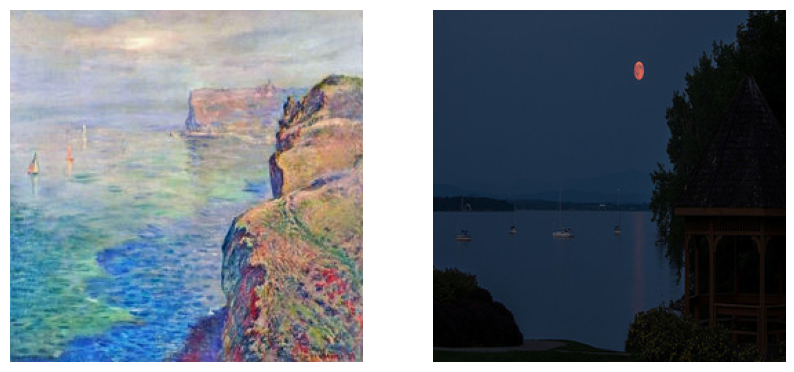

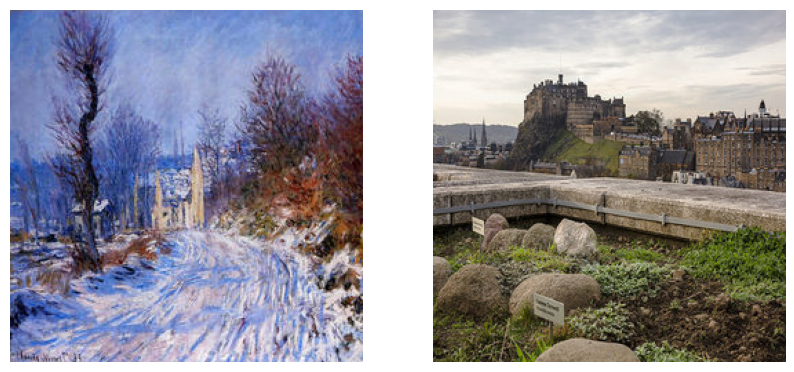

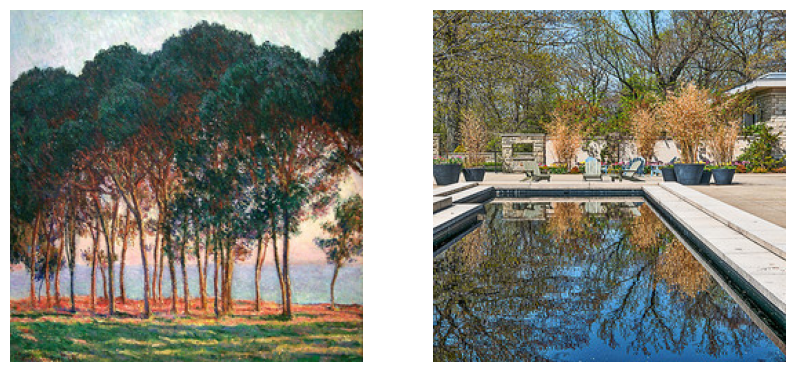

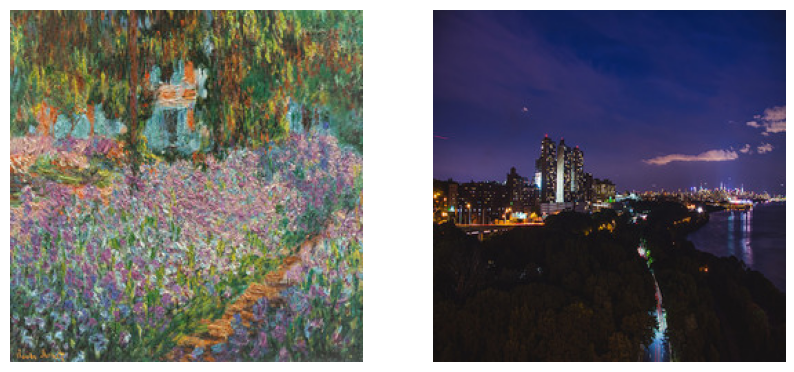

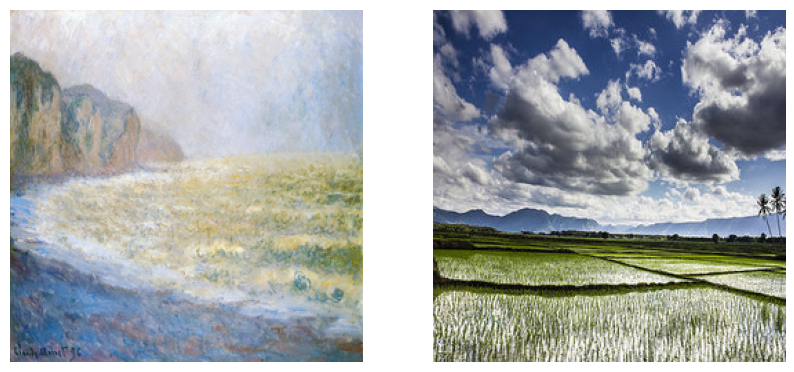

In [ ]:
for i in range(5):
    id = np.random.randint(len(monet_images))
    monet, photo = monet_images[id], photo_images[id]

    plt.figure(figsize=(10,8))

    plt.subplot(1,2,1)
    show_image(monet)

    plt.subplot(1,2,2)
    show_image(photo)
    plt.show()

In [ ]:
def ResidualBlock(filters, layer, index):
    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False)(layer)
    x = InstanceNormalization(axis=-1)(x)
    x = ReLU()(x)

    x = Conv2D(filters, kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal', use_bias=False)(x)
    x = InstanceNormalization(axis=-1)(x)

    x = concatenate([x, layer])

    return x


In [ ]:
def downsample(filters, layer, size=3, strides=2, activation=None, index=None, norm=True):
    x = Conv2D(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False)(layer)
    if norm:
        x = InstanceNormalization(axis=-1)(x)
    if activation is not None:
        x = Activation(activation)(x)
    else:
        x = LeakyReLU()(x)
    return x


In [ ]:
def upsample(filters, layer, size=3, strides=2, index=None):
    x = Conv2DTranspose(filters, kernel_size=size, strides=strides, padding='same', kernel_initializer='he_normal', use_bias=False)(layer)
    x = InstanceNormalization(axis=-1)(x)
    x = ReLU()(x)
    return x


In [ ]:
def Generator(n_resnet=9, name="Generator"):

    inp_image = Input(shape=(SIZE, SIZE, 3), name="InputImage")         # 256 x 256 x3

    x = downsample(64, inp_image, size=7, strides=1, index=1)           # 256 x 256 x 64
    x = downsample(128, x, index=2)                                     # 128 x 128 x 128
    x = downsample(256, x, index=3)                                     # 64 x 64 x 256

    for i in range(n_resnet):
        x = ResidualBlock(256, x, index=i+4)                            # (64 x 64 x 256) x n_resnet

    x = upsample(128, x, index=13)                                      # 128 x 128 x 128
    x = upsample(64, x, index=14)                                       # 256 x 256 x 64
    x = downsample(3, x, size=7, strides=1, activation='tanh', index=15) # 256 x 256 x 3

    model = Model( inputs=inp_image,outputs=x, name=name)
    return model

In [ ]:
def Discriminator(name='Discriminator'):
    init = RandomNormal(stddev=0.02)
    src_img = Input(shape=(SIZE, SIZE, 3), name="InputImage")     # 256 x 256 x 3
    x = downsample(64, src_img, size=4, strides=2, index=1, norm=False) # 128 x 128 x 64
    x = downsample(128, x, size=4, strides=2, index=2)            # 64 x 64 x 128
    x = downsample(256, x, size=4, strides=2, index=3)            # 32 x 32 x 256
    x = downsample(512, x, size=4, strides=2, index=4)            # 16 x 16 x 512
    x = downsample(512, x, size=4, strides=2, index=5)            # 8 x 8 x 512  # we can try out a different architecture with zero padding layer.
    patch_out = Conv2D(1, kernel_size=4, padding='same', kernel_initializer=init, use_bias=False)(x) # 8 x 8 x 1

    model = Model(inputs=src_img, outputs=patch_out, name=name)

    model.compile(loss='mse', optimizer=Adam(learning_rate=2e-4, beta_1=0.5), loss_weights=[0.5])

    return model

In [ ]:
def CombineModel(g_model1, g_model2, d_model, name):
    # train the Generator
    g_model1.trainable = True

    # Stop the Discriminator and 2nd Generator
    d_model.trainable = False
    g_model2.trainable = False

    # Adversarial Loss
    input_gen = Input(shape=(SIZE, SIZE, 3))
    gen_1_out = g_model1(input_gen)
    dis_out = d_model(gen_1_out)

    # Identity Loss
    input_id = Input(shape=(SIZE, SIZE, 3))
    output_id = g_model1(input_id)

    # Cycle Loss - Forward
    output_f = g_model2(gen_1_out)

    # Cycle Loss - Backward
    gen_2_out = g_model2(input_id)
    output_b = g_model1(gen_2_out)

    # Final Model
    model = Model(
        inputs=[input_gen, input_id],
        outputs=[dis_out, output_id, output_f, output_b],
        name=name
    )
    model.compile(
        loss=['mse', 'mae', 'mae', 'mae'],
        loss_weights=[1,5,10,10],
        optimizer= Adam(learning_rate=2e-4, beta_1=0.5)
    )
    return model

In [ ]:
def generate_real_samples(n_samples, dataset):
    ix = np.random.randint(0,dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones(shape=(n_samples, 8, 8, 1))
    return X, y

In [ ]:
def generate_fake_samples(g_model, dataset):
    X = g_model.predict(dataset)
    y = np.zeros(shape=(len(dataset), 8, 8, 1))
    return X, y

In [ ]:
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            pool.append(image)
            selected.append(image)
        elif random() < 0.5:
            selected.append(image)
        else:
            ix = np.random.randint(0,len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return np.asarray(selected)

In [ ]:
def show_preds(g_AB, g_BA,n_images=1):
    for i in range(n_images):

        id = np.random.randint(len(monet_images))
        monet, photo = monet_images[id], photo_images[id]
        monet_pred, photo_pred = g_BA.predict(tf.expand_dims(photo,axis=0))[0], g_AB.predict(tf.expand_dims(monet,axis=0))[0]

        plt.figure(figsize=(10,8))

        plt.subplot(1,4,1)
        show_image(monet, title='Original Monet')

        plt.subplot(1,4,2)
        show_image(photo_pred, title='Generated Photo')

        plt.subplot(1,4,3)
        show_image(photo, title='Original Photo')

        plt.subplot(1,4,4)
        show_image(monet_pred, title='Generated Monet')

        plt.tight_layout()
        plt.show()

In [ ]:
def train(d_model_A, d_model_B, gen_AB, gen_BA, c_AB, c_BA, epochs=10, chunk=5):

    n_epochs, n_batch = epochs, 1

    trainA, trainB = dataset
    poolA, poolB = list(), list()

    # in simple words, we are going through the whole data.
    bat_per_epoch = int(len(trainA)/n_batch)
    n_steps = bat_per_epoch

    for j in tqdm(range(1,epochs+1), desc="Epochs"):
        print("Epoch ",j)
        for i in range(n_steps):
            print("Step ",i)

            # Let's get some real data in hand.
            X_realA, y_realA = generate_real_samples(n_batch, trainA)
            X_realB, y_realB = generate_real_samples(n_batch, trainB)

            # use our generators to generate some fake data.
            X_fakeA, y_fakeA = generate_fake_samples(gen_BA, X_realB)
            X_fakeB, y_fakeB = generate_fake_samples(gen_AB, X_realA)

            # create a pool of images. You can also understand it like a replay buffer.
            X_fakeA = update_image_pool(poolA, X_fakeA)
            X_fakeB = update_image_pool(poolA, X_fakeB)


            # Let's finally train the gen 2 and get the losses.
            gen_loss2, _, _, _, _ = c_BA.train_on_batch(
                [X_realB, X_realA],
                [y_realB, X_realA, X_realB, X_realA]
            )

            # It's time for our discriminator to win our generator.
            dA_loss_1 = d_model_A.train_on_batch(X_realA, y_realA)
            dA_loss_2 = d_model_A.train_on_batch(X_fakeA, y_fakeA)

            # one cycle is completed, let's move to second cycle.
            gen_loss1, _, _, _, _ = c_AB.train_on_batch(
                [X_realA, X_realB],
                [y_realA, X_realB, X_realA, X_realB]
            )

            # again, let's give some power to our discriminators.
            dB_loss_1 = d_model_B.train_on_batch(X_realB, y_realB)
            dB_loss_2 = d_model_B.train_on_batch(X_fakeB, y_fakeB)

        if (j%chunk)==0:
            show_preds(gen_AB, gen_BA, n_images=1)
            gen_AB.save("GeneratorHtoZ.h5")
            gen_BA.save("GeneratorZtoH.h5")

In [ ]:
# let's create our generators.
g_AB = Generator(name="GeneratorAB")
g_BA = Generator(name="GeneratorBA")

# here are the respective discriminators.
d_A = Discriminator(name="DiscriminatorA")
d_B = Discriminator(name="DiscriminatorB")

# finally, let's combine all of them.
c_AB = CombineModel(g_AB, g_BA, d_B, name="GanAB")
c_BA = CombineModel(g_BA, g_AB, d_A, name="GanBA")

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch  1
Step  0
1/1 [==============================] - 1s 906ms/step
Step  1
1/1 [==============================] - 0s 23ms/step
Step  2
1/1 [==============================] - 0s 32ms/step
Step  3
1/1 [==============================] - 0s 23ms/step
Step  4
1/1 [==============================] - 0s 22ms/step
Step  5
1/1 [==============================] - 0s 29ms/step
Step  6
1/1 [==============================] - 0s 22ms/step
Step  7
1/1 [==============================] - 0s 25ms/step
Step  8
1/1 [==============================] - 0s 34ms/step
Step  9
1/1 [==============================] - 0s 23ms/step
Step  10
1/1 [==============================] - 0s 22ms/step
Step  11
1/1 [==============================] - 0s 22ms/step
Step  12
1/1 [==============================] - 0s 22ms/step
Step  13
1/1 [==============================] - 0s 22ms/step
Step  14
1/1 [==============================] - 0s 34ms/step
Step  15
1/1 [==============================] - 0s 21ms/step
Step  16
1/1 [==========

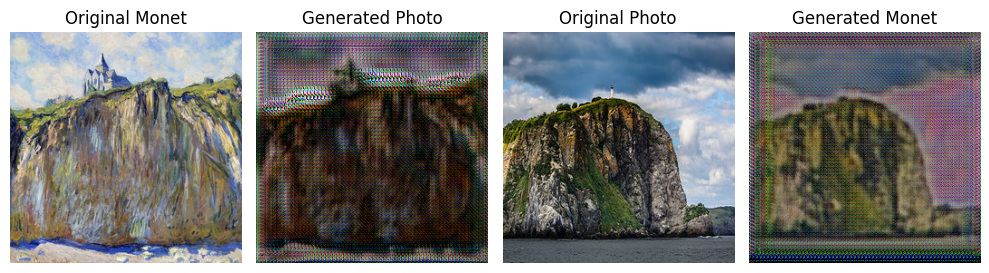

Epochs:  10%|█         | 1/10 [36:39<5:29:54, 2199.40s/it]

Epoch  2
Step  0
1/1 [==============================] - 0s 21ms/step
Step  1
1/1 [==============================] - 0s 21ms/step
Step  2
1/1 [==============================] - 0s 27ms/step
Step  3
1/1 [==============================] - 0s 21ms/step
Step  4
1/1 [==============================] - 0s 36ms/step
Step  5
1/1 [==============================] - 0s 22ms/step
Step  6
1/1 [==============================] - 0s 22ms/step
Step  7
1/1 [==============================] - 0s 27ms/step
Step  8
1/1 [==============================] - 0s 22ms/step
Step  9
1/1 [==============================] - 0s 23ms/step
Step  10
1/1 [==============================] - 0s 33ms/step
Step  11
1/1 [==============================] - 0s 21ms/step
Step  12
1/1 [==============================] - 0s 21ms/step
Step  13
1/1 [==============================] - 0s 21ms/step
Step  14
1/1 [==============================] - 0s 21ms/step
Step  15
1/1 [==============================] - 0s 24ms/step
Step  16
1/1 [===========

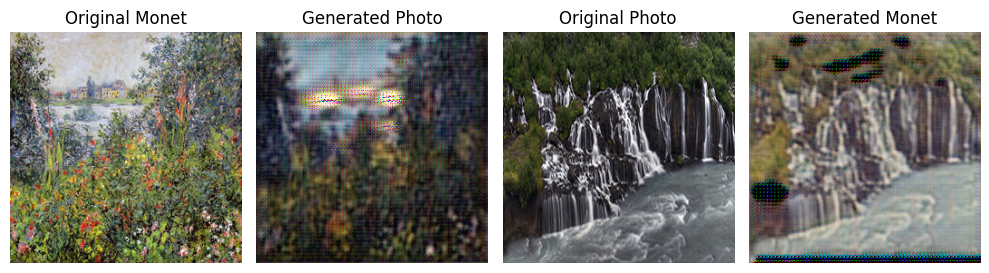

Epochs:  20%|██        | 2/10 [1:11:53<4:46:35, 2149.40s/it]

Epoch  3
Step  0
1/1 [==============================] - 0s 26ms/step
Step  1
1/1 [==============================] - 0s 22ms/step
Step  2
1/1 [==============================] - 0s 38ms/step
Step  3
1/1 [==============================] - 0s 22ms/step
Step  4
1/1 [==============================] - 0s 24ms/step
Step  5
1/1 [==============================] - 0s 22ms/step
Step  6
1/1 [==============================] - 0s 21ms/step
Step  7
1/1 [==============================] - 0s 23ms/step
Step  8
1/1 [==============================] - 0s 35ms/step
Step  9
1/1 [==============================] - 0s 22ms/step
Step  10
1/1 [==============================] - 0s 23ms/step
Step  11
1/1 [==============================] - 0s 23ms/step
Step  12
1/1 [==============================] - 0s 24ms/step
Step  13
1/1 [==============================] - 0s 21ms/step
Step  14
1/1 [==============================] - 0s 34ms/step
Step  15
1/1 [==============================] - 0s 23ms/step
Step  16
1/1 [===========

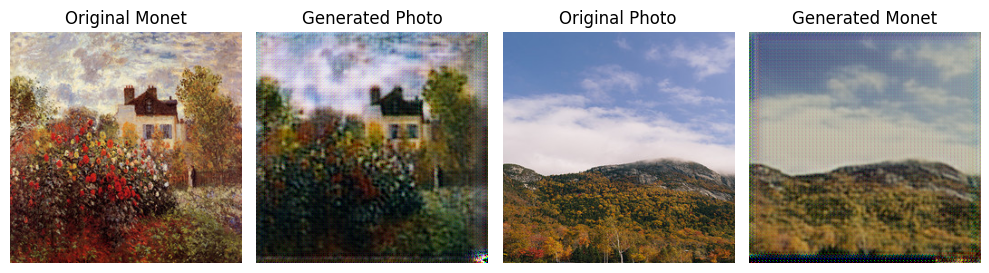

Epochs:  30%|███       | 3/10 [1:47:12<4:09:08, 2135.49s/it]

Epoch  4
Step  0
1/1 [==============================] - 0s 22ms/step
Step  1
1/1 [==============================] - 0s 35ms/step
Step  2
1/1 [==============================] - 0s 23ms/step
Step  3
1/1 [==============================] - 0s 22ms/step
Step  4
1/1 [==============================] - 0s 25ms/step
Step  5
1/1 [==============================] - 0s 22ms/step
Step  6
1/1 [==============================] - 0s 21ms/step
Step  7
1/1 [==============================] - 0s 21ms/step
Step  8
1/1 [==============================] - 0s 26ms/step
Step  9
1/1 [==============================] - 0s 22ms/step
Step  10
1/1 [==============================] - 0s 22ms/step
Step  11
1/1 [==============================] - 0s 24ms/step
Step  12
1/1 [==============================] - 0s 38ms/step
Step  13
1/1 [==============================] - 0s 23ms/step
Step  14
1/1 [==============================] - 0s 28ms/step
Step  15
1/1 [==============================] - 0s 25ms/step
Step  16
1/1 [===========

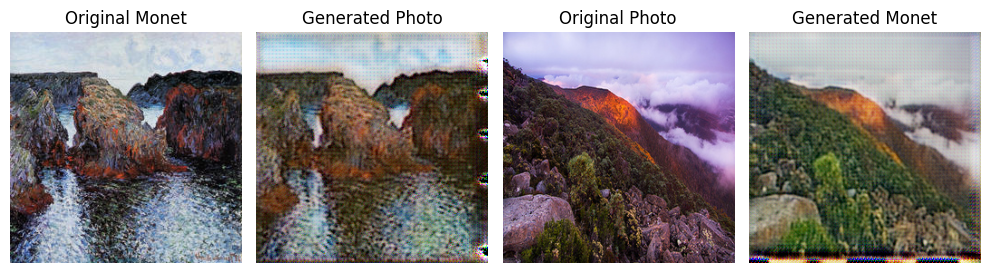

Epochs:  40%|████      | 4/10 [2:22:41<3:33:16, 2132.68s/it]

Epoch  5
Step  0
1/1 [==============================] - 0s 27ms/step
Step  1
1/1 [==============================] - 0s 45ms/step
Step  2
1/1 [==============================] - 0s 30ms/step
Step  3
1/1 [==============================] - 0s 32ms/step
Step  4
1/1 [==============================] - 0s 29ms/step
Step  5
1/1 [==============================] - 0s 32ms/step
Step  6
1/1 [==============================] - 0s 27ms/step
Step  7
1/1 [==============================] - 0s 41ms/step
Step  8
1/1 [==============================] - 0s 28ms/step
Step  9
1/1 [==============================] - 0s 33ms/step
Step  10
1/1 [==============================] - 0s 29ms/step
Step  11
1/1 [==============================] - 0s 29ms/step
Step  12
1/1 [==============================] - 0s 28ms/step
Step  13
1/1 [==============================] - 0s 29ms/step
Step  14
1/1 [==============================] - 0s 28ms/step
Step  15
1/1 [==============================] - 0s 29ms/step
Step  16
1/1 [===========

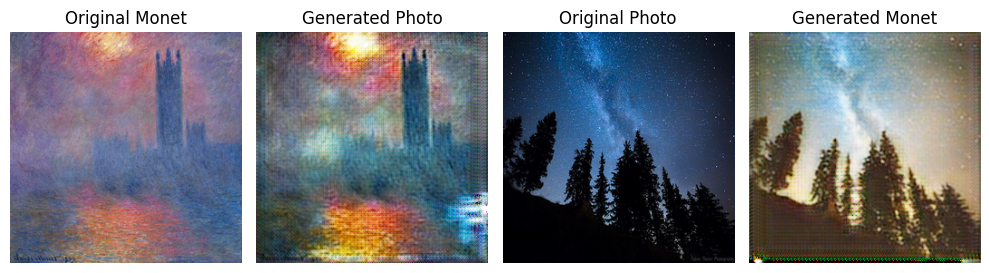

Epochs:  50%|█████     | 5/10 [2:58:12<2:57:40, 2132.18s/it]

Epoch  6
Step  0
1/1 [==============================] - 0s 22ms/step
Step  1
1/1 [==============================] - 0s 31ms/step
Step  2
1/1 [==============================] - 0s 26ms/step
Step  3
1/1 [==============================] - 0s 32ms/step
Step  4
1/1 [==============================] - 0s 28ms/step
Step  5
1/1 [==============================] - 0s 23ms/step
Step  6
1/1 [==============================] - 0s 24ms/step
Step  7
1/1 [==============================] - 0s 25ms/step
Step  8
1/1 [==============================] - 0s 25ms/step
Step  9
1/1 [==============================] - 0s 64ms/step
Step  10
1/1 [==============================] - 0s 29ms/step
Step  11
1/1 [==============================] - 0s 24ms/step
Step  12
1/1 [==============================] - 0s 26ms/step
Step  13
1/1 [==============================] - 0s 22ms/step
Step  14
1/1 [==============================] - 0s 26ms/step
Step  15
1/1 [==============================] - 0s 46ms/step
Step  16
1/1 [===========

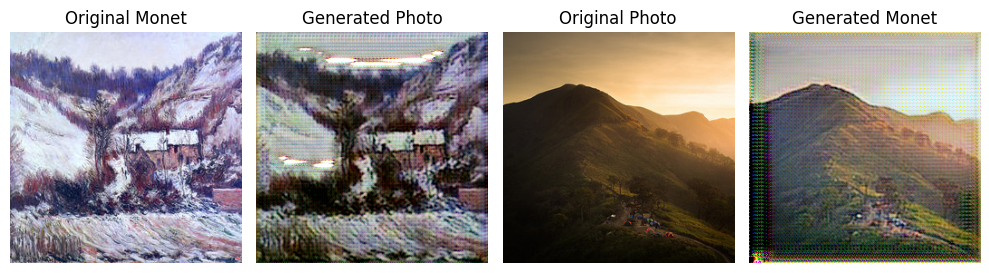

Epochs:  60%|██████    | 6/10 [3:33:40<2:22:02, 2130.75s/it]

Epoch  7
Step  0
1/1 [==============================] - 0s 22ms/step
Step  1
1/1 [==============================] - 0s 29ms/step
Step  2
1/1 [==============================] - 0s 31ms/step
Step  3
1/1 [==============================] - 0s 35ms/step
Step  4
1/1 [==============================] - 0s 32ms/step
Step  5
1/1 [==============================] - 0s 32ms/step
Step  6
1/1 [==============================] - 0s 30ms/step
Step  7
1/1 [==============================] - 0s 29ms/step
Step  8
1/1 [==============================] - 0s 35ms/step
Step  9
1/1 [==============================] - 0s 30ms/step
Step  10
1/1 [==============================] - 0s 31ms/step
Step  11
1/1 [==============================] - 0s 30ms/step
Step  12
1/1 [==============================] - 0s 29ms/step
Step  13
1/1 [==============================] - 0s 27ms/step
Step  14
1/1 [==============================] - 0s 31ms/step
Step  15
1/1 [==============================] - 0s 32ms/step
Step  16
1/1 [===========

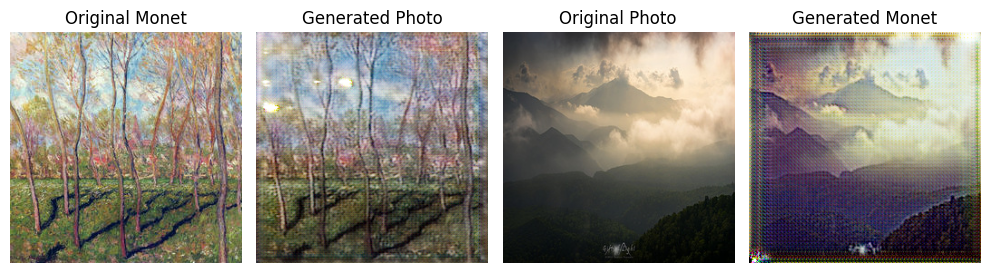

Epochs:  70%|███████   | 7/10 [4:08:54<1:46:16, 2125.47s/it]

Epoch  8
Step  0
1/1 [==============================] - 0s 24ms/step
Step  1
1/1 [==============================] - 0s 30ms/step
Step  2
1/1 [==============================] - 0s 29ms/step
Step  3
1/1 [==============================] - 0s 30ms/step
Step  4
1/1 [==============================] - 0s 31ms/step
Step  5
1/1 [==============================] - 0s 43ms/step
Step  6
1/1 [==============================] - 0s 32ms/step
Step  7
1/1 [==============================] - 0s 31ms/step
Step  8
1/1 [==============================] - 0s 33ms/step
Step  9
1/1 [==============================] - 0s 36ms/step
Step  10
1/1 [==============================] - 0s 28ms/step
Step  11
1/1 [==============================] - 0s 35ms/step
Step  12
1/1 [==============================] - 0s 29ms/step
Step  13
1/1 [==============================] - 0s 34ms/step
Step  14
1/1 [==============================] - 0s 29ms/step
Step  15
1/1 [==============================] - 0s 30ms/step
Step  16
1/1 [===========

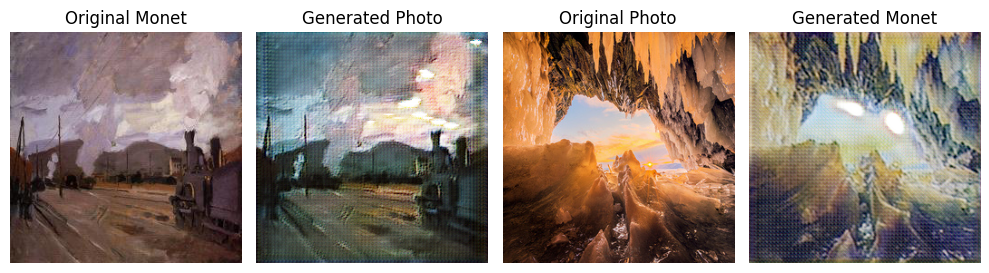

Epochs:  80%|████████  | 8/10 [4:44:02<1:10:39, 2119.80s/it]

Epoch  9
Step  0
1/1 [==============================] - 0s 31ms/step
Step  1
1/1 [==============================] - 0s 32ms/step
Step  2
1/1 [==============================] - 0s 35ms/step
Step  3
1/1 [==============================] - 0s 32ms/step
Step  4
1/1 [==============================] - 0s 31ms/step
Step  5
1/1 [==============================] - 0s 55ms/step
Step  6
1/1 [==============================] - 0s 37ms/step
Step  7
1/1 [==============================] - 0s 34ms/step
Step  8
1/1 [==============================] - 0s 30ms/step
Step  9
1/1 [==============================] - 0s 70ms/step
Step  10
1/1 [==============================] - 0s 37ms/step
Step  11
1/1 [==============================] - 0s 34ms/step
Step  12
1/1 [==============================] - 0s 36ms/step
Step  13
1/1 [==============================] - 0s 36ms/step
Step  14
1/1 [==============================] - 0s 32ms/step
Step  15
1/1 [==============================] - 0s 31ms/step
Step  16
1/1 [===========

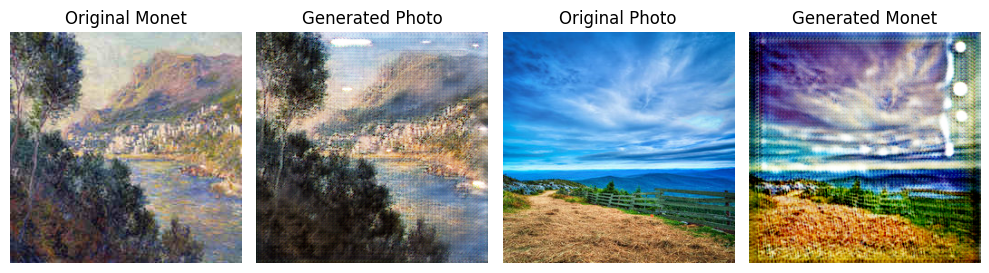

Epochs:  90%|█████████ | 9/10 [5:19:41<35:25, 2125.81s/it]  

Epoch  10
Step  0
1/1 [==============================] - 0s 33ms/step
Step  1
1/1 [==============================] - 0s 33ms/step
Step  2
1/1 [==============================] - 0s 32ms/step
Step  3
1/1 [==============================] - 0s 35ms/step
Step  4
1/1 [==============================] - 0s 32ms/step
Step  5
1/1 [==============================] - 0s 43ms/step
Step  6
1/1 [==============================] - 0s 75ms/step
Step  7
1/1 [==============================] - 0s 31ms/step
Step  8
1/1 [==============================] - 0s 34ms/step
Step  9
1/1 [==============================] - 0s 35ms/step
Step  10
1/1 [==============================] - 0s 31ms/step
Step  11
1/1 [==============================] - 0s 67ms/step
Step  12
1/1 [==============================] - 0s 33ms/step
Step  13
1/1 [==============================] - 0s 32ms/step
Step  14
1/1 [==============================] - 0s 31ms/step
Step  15
1/1 [==============================] - 0s 34ms/step
Step  16
1/1 [==========

In [ ]:
train(d_A, d_B, g_AB, g_BA, c_AB, c_BA, epochs=10, chunk=1)